# Import Libraries

In [2]:
import numpy as np
import pandas as pd

# Import Data

In [3]:
loan_data = pd.read_csv('preprocessed_loan_data.csv')

/tmp/ipykernel_790960/1507514722.py:1: DtypeWarning: Columns (2,21,51,61,120,131,132,133,136,137,138,141,147,148,149) have mixed types. Specify dtype option on import or set low_memory=False.
  loan_data = pd.read_csv('preprocessed_loan_data.csv')


# Explore Data

In [4]:
loan_data_preprocessed = loan_data.copy()

In [5]:
loan_data_preprocessed.columns.values
# Displays all column names.

array(['Unnamed: 0.1', 'Unnamed: 0', 'id', 'member_id', 'loan_amnt',
       'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'issue_d',
       'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose', 'title',
       'zip_code', 'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'fico_range_low', 'fico_range_high', 'inq_last_6mths',
       'mths_since_last_delinq', 'mths_since_last_record', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'initial_list_status', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d',
       'last_credit_pull_d', 'last_fico_range_high',
       'last_fico_range_low', 'collections_12_mths_ex_med',
       'mth

In [6]:
loan_data_preprocessed.head()

,Unnamed: 0.1,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,...,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w
0,0,0,68407277,NaN,3600.0,3600.0,3600.0,36 months,13.99,123.03,...,0,0,0,0,0,0,0,0,0,1
1,1,1,68355089,NaN,24700.0,24700.0,24700.0,36 months,11.99,820.28,...,0,0,0,0,0,0,0,0,0,1
2,2,2,68341763,NaN,20000.0,20000.0,20000.0,60 months,10.78,432.66,...,0,0,0,0,0,0,0,0,0,1
3,3,3,66310712,NaN,35000.0,35000.0,35000.0,60 months,14.85,829.90,...,0,0,0,0,0,0,0,0,0,1
4,4,4,68476807,NaN,10400.0,10400.0,10400.0,60 months,22.45,289.91,...,0,0,0,0,0,0,0,0,0,1


In [7]:
loan_data_preprocessed.tail()

,Unnamed: 0.1,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,...,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w
2260696,2260696,2260696,88985880,NaN,40000.0,40000.0,40000.0,60 months,10.49,859.56,...,0,0,0,0,0,0,0,0,1,0
2260697,2260697,2260697,88224441,NaN,24000.0,24000.0,24000.0,60 months,14.49,564.56,...,0,0,0,0,0,0,0,0,1,0
2260698,2260698,2260698,88215728,NaN,14000.0,14000.0,14000.0,60 months,14.49,329.33,...,1,0,0,0,0,0,0,0,0,1
2260699,2260699,2260699,Total amount funded in policy code 1: 1465324575,NaN,NaN,12875.0,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
2260700,2260700,2260700,Total amount funded in policy code 2: 521953170,NaN,NaN,12875.0,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0


In [8]:
loan_data_defaults = loan_data_preprocessed[loan_data_preprocessed['loan_status'].isin(['Charged Off','Does not meet the credit policy. Status:Charged Off'])]
# Here we take only the accounts that were charged-off (written-off).

In [9]:
loan_data_preprocessed['dti'].median()

17.84

In [10]:
loan_data_preprocessed['dti'] = loan_data_preprocessed['dti'].fillna(17.84)

In [11]:
loan_data_preprocessed['dti'].isnull().sum()

0

In [12]:
loan_data_defaults.shape

(269320, 285)

In [13]:
pd.options.display.max_rows = None
# Sets the pandas dataframe options to display all columns/ rows.

In [14]:
loan_data_defaults.isnull().sum()

Unnamed: 0.1                                                            0
Unnamed: 0                                                              0
id                                                                      0
member_id                                                          269320
loan_amnt                                                               0
funded_amnt                                                             0
funded_amnt_inv                                                         0
term                                                                    0
int_rate                                                                0
installment                                                             0
grade                                                                   0
sub_grade                                                               0
emp_title                                                           22511
emp_length                            

# Independent Variables

In [15]:
loan_data_defaults['mths_since_last_delinq'].fillna(0, inplace = True)
# We fill the missing values with zeroes.

/tmp/ipykernel_790960/1935142453.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loan_data_defaults['mths_since_last_delinq'].fillna(0, inplace = True)


In [16]:
#loan_data_defaults['mths_since_last_delinq'].fillna(loan_data_defaults['mths_since_last_delinq'].max() + 12, inplace=True)

In [17]:
loan_data_defaults['mths_since_last_record'].fillna(0, inplace=True)
# We fill the missing values with zeroes.

/tmp/ipykernel_790960/4107388959.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loan_data_defaults['mths_since_last_record'].fillna(0, inplace=True)


# Dependent Variables

In [18]:
loan_data_defaults['recovery_rate'] = loan_data_defaults['recoveries'] / loan_data_defaults['funded_amnt']
# We calculate the dependent variable for the LGD model: recovery rate.
# It is the ratio of recoveries and funded amount.

/tmp/ipykernel_790960/591376217.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loan_data_defaults['recovery_rate'] = loan_data_defaults['recoveries'] / loan_data_defaults['funded_amnt']


In [19]:
loan_data_defaults['recovery_rate'].describe()
# Shows some descriptive statisics for the values of a column.

count    269320.000000
mean          0.075338
std           0.095224
min           0.000000
25%           0.000000
50%           0.061853
75%           0.112435
max           2.170300
Name: recovery_rate, dtype: float64

In [20]:
loan_data_defaults['recovery_rate'] = np.where(loan_data_defaults['recovery_rate'] > 1, 1, loan_data_defaults['recovery_rate'])
loan_data_defaults['recovery_rate'] = np.where(loan_data_defaults['recovery_rate'] < 0, 0, loan_data_defaults['recovery_rate'])
# We set recovery rates that are greater than 1 to 1 and recovery rates that are less than 0 to 0.

/tmp/ipykernel_790960/1169471315.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loan_data_defaults['recovery_rate'] = np.where(loan_data_defaults['recovery_rate'] > 1, 1, loan_data_defaults['recovery_rate'])
/tmp/ipykernel_790960/1169471315.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loan_data_defaults['recovery_rate'] = np.where(loan_data_defaults['recovery_rate'] < 0, 0, loan_data_defaults['recovery_rate'])


In [21]:
loan_data_defaults['recovery_rate'].describe()
# Shows some descriptive statisics for the values of a column.

count    269320.000000
mean          0.075309
std           0.094896
min           0.000000
25%           0.000000
50%           0.061853
75%           0.112435
max           1.000000
Name: recovery_rate, dtype: float64

In [22]:
loan_data_defaults['CCF'] = (loan_data_defaults['funded_amnt'] - loan_data_defaults['total_rec_prncp']) / loan_data_defaults['funded_amnt']
# We calculate the dependent variable for the EAD model: credit conversion factor.
# It is the ratio of the difference of the amount used at the moment of default to the total funded amount.

/tmp/ipykernel_790960/3733798387.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loan_data_defaults['CCF'] = (loan_data_defaults['funded_amnt'] - loan_data_defaults['total_rec_prncp']) / loan_data_defaults['funded_amnt']


In [23]:
loan_data_defaults['CCF'].describe()
# Shows some descriptive statisics for the values of a column.

count    269320.000000
mean          0.697208
std           0.218809
min           0.000000
25%           0.566590
50%           0.747175
75%           0.871866
max           1.000000
Name: CCF, dtype: float64

In [24]:
loan_data_defaults.to_csv('loan_data_defaults.csv')
# We save the data to a CSV file.

# Explore Dependent Variables

In [25]:
loan_data_defaults['recovery_rate']

13         8.993889e-02
25         8.718817e-02
30         0.000000e+00
31         0.000000e+00
33         0.000000e+00
41         0.000000e+00
60         0.000000e+00
63         1.588171e-01
65         1.068500e-01
68         4.957500e-01
78         0.000000e+00
79         0.000000e+00
83         9.864026e-02
84         0.000000e+00
99         1.005292e-01
102        1.008667e-01
105        2.507582e-01
118        7.384840e-02
128        7.326181e-02
132        3.533049e-02
143        8.250000e-02
144        3.829429e-01
146        0.000000e+00
149        7.989437e-02
152        2.729000e-01
158        7.645375e-02
160        0.000000e+00
171        0.000000e+00
174        0.000000e+00
177        3.621000e-02
181        8.865867e-02
184        3.214286e-02
205        9.518790e-02
217        0.000000e+00
218        0.000000e+00
231        6.810100e-02
237        9.615055e-02
246        3.765517e-02
247        1.091750e-01
248        0.000000e+00
249        5.597692e-02
276        6.865

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

(array([9.6344e+04, 4.6710e+03, 5.6280e+03, 7.8120e+03, 8.0900e+03,
        1.0348e+04, 1.0209e+04, 1.2764e+04, 1.4926e+04, 1.5877e+04,
        1.2528e+04, 1.1717e+04, 1.2781e+04, 1.1301e+04, 5.2950e+03,
        3.1390e+03, 2.9640e+03, 2.6470e+03, 1.9310e+03, 1.6990e+03,
        1.6570e+03, 1.1650e+03, 8.5100e+02, 6.6100e+02, 5.4600e+02,
        5.5500e+02, 5.2500e+02, 5.2800e+02, 5.4800e+02, 4.7900e+02,
        5.5600e+02, 5.2400e+02, 4.8600e+02, 5.1400e+02, 5.1700e+02,
        4.9500e+02, 4.4300e+02, 4.2300e+02, 4.4500e+02, 4.2700e+02,
        4.4400e+02, 3.4200e+02, 3.3000e+02, 3.0000e+02, 2.6800e+02,
        2.4000e+02, 2.0200e+02, 1.6800e+02, 1.5800e+02, 1.3700e+02,
        1.3500e+02, 1.0600e+02, 1.0400e+02, 9.3000e+01, 6.8000e+01,
        6.6000e+01, 4.9000e+01, 5.6000e+01, 5.0000e+01, 4.7000e+01,
        5.3000e+01, 3.7000e+01, 4.8000e+01, 3.5000e+01, 3.4000e+01,
        3.3000e+01, 2.9000e+01, 2.4000e+01, 3.1000e+01, 2.0000e+01,
        2.0000e+01, 1.4000e+01, 1.9000e+01, 1.70

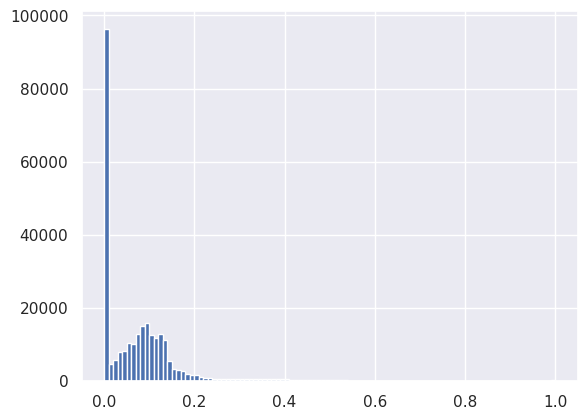

In [27]:
plt.hist(loan_data_defaults['recovery_rate'], bins = 100)
# We plot a histogram of a variable with 100 bins.

(array([1.01015e+05, 1.34400e+04, 1.84380e+04, 2.29730e+04, 3.08030e+04,
        2.42450e+04, 2.40820e+04, 8.43400e+03, 5.61100e+03, 3.63000e+03,
        2.82200e+03, 1.51200e+03, 1.10100e+03, 1.05300e+03, 1.02700e+03,
        1.08000e+03, 1.00000e+03, 1.01200e+03, 8.66000e+02, 8.72000e+02,
        7.86000e+02, 6.30000e+02, 5.08000e+02, 3.70000e+02, 2.95000e+02,
        2.41000e+02, 1.97000e+02, 1.34000e+02, 1.05000e+02, 9.70000e+01,
        9.00000e+01, 8.30000e+01, 6.70000e+01, 5.30000e+01, 5.10000e+01,
        3.40000e+01, 3.60000e+01, 4.00000e+01, 4.60000e+01, 4.50000e+01,
        2.80000e+01, 3.00000e+01, 3.60000e+01, 2.80000e+01, 2.90000e+01,
        1.90000e+01, 3.80000e+01, 3.10000e+01, 3.00000e+01, 1.27000e+02]),
 array([0.  , 0.02, 0.04, 0.06, 0.08, 0.1 , 0.12, 0.14, 0.16, 0.18, 0.2 ,
        0.22, 0.24, 0.26, 0.28, 0.3 , 0.32, 0.34, 0.36, 0.38, 0.4 , 0.42,
        0.44, 0.46, 0.48, 0.5 , 0.52, 0.54, 0.56, 0.58, 0.6 , 0.62, 0.64,
        0.66, 0.68, 0.7 , 0.72, 0.74, 0.76, 0.

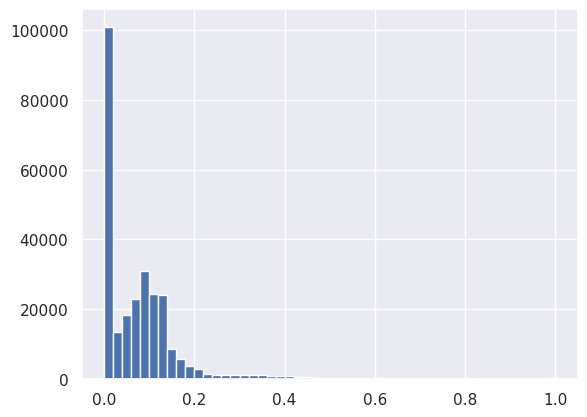

In [28]:
plt.hist(loan_data_defaults['recovery_rate'], bins = 50)
# We plot a histogram of a variable with 50 bins.

(array([  97.,   76.,   88.,  591.,   93.,  110.,  791.,  246.,  121.,
         737.,  528.,  175.,  606.,  779.,  287.,  624.,  878.,  445.,
         638.,  957.,  651.,  674., 1065.,  754.,  843., 1103.,  922.,
         950., 1151.,  959., 1083., 1305., 1161., 1271., 1478., 1336.,
        1335., 1632., 1538., 1489., 1731., 1668., 1680., 1904., 1882.,
        1963., 2104., 2025., 2150., 2202., 2107., 2468., 2441., 2269.,
        2664., 2768., 2717., 3173., 2738., 3081., 3144., 3149., 3412.,
        3398., 3439., 3900., 3524., 3872., 4006., 4015., 4333., 4630.,
        4449., 4659., 4695., 4896., 4948., 4832., 5324., 4957., 5478.,
        5445., 5081., 6338., 5446., 5980., 6247., 5671., 6931., 5306.,
        7138., 6107., 5195., 6862., 4101., 6947., 3623., 5188., 2118.,
        3234.]),
 array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
        0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
        0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29

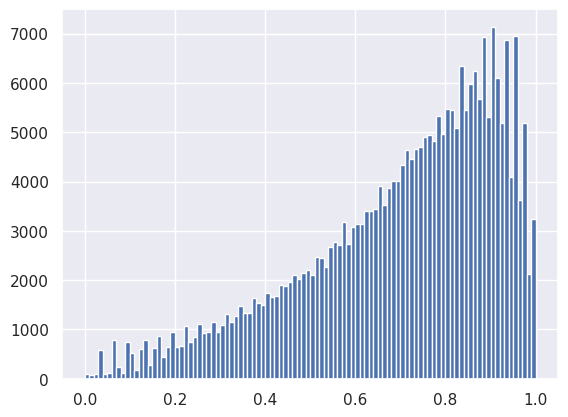

In [29]:
plt.hist(loan_data_defaults['CCF'], bins = 100)
# We plot a histogram of a variable with 100 bins.

In [30]:
loan_data_defaults['recovery_rate_0_1'] = np.where(loan_data_defaults['recovery_rate'] == 0, 0, 1)
# We create a new variable which is 0 if recovery rate is 0 and 1 otherwise.

/tmp/ipykernel_790960/2299087683.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loan_data_defaults['recovery_rate_0_1'] = np.where(loan_data_defaults['recovery_rate'] == 0, 0, 1)


In [31]:
loan_data_defaults['recovery_rate_0_1']

13         1
25         1
30         0
31         0
33         0
41         0
60         0
63         1
65         1
68         1
78         0
79         0
83         1
84         0
99         1
102        1
105        1
118        1
128        1
132        1
143        1
144        1
146        0
149        1
152        1
158        1
160        0
171        0
174        0
177        1
181        1
184        1
205        1
217        0
218        0
231        1
237        1
246        1
247        1
248        0
249        1
276        1
277        1
291        1
297        1
308        1
312        0
320        1
321        1
331        1
335        0
342        0
350        1
355        1
358        1
360        0
361        1
365        1
370        1
377        1
382        0
383        0
384        0
393        1
419        1
427        1
436        0
442        1
443        1
449        1
456        1
476        1
489        0
502        1
505        0
507        0
508        1

# LGD Model

### Splitting Data

In [32]:
from sklearn.model_selection import train_test_split

In [33]:
loan_data_defaults['dti'].isnull().sum()

71

In [34]:
loan_data_defaults['dti'].median()

19.75

In [35]:
loan_data_defaults['dti'] = loan_data_defaults['dti'].fillna(19.75)

/tmp/ipykernel_790960/469286503.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  loan_data_defaults['dti'] = loan_data_defaults['dti'].fillna(19.75)


In [36]:
loan_data_defaults['dti'].isnull().sum()

0

In [37]:
# LGD model stage 1 datasets: recovery rate 0 or greater than 0.
lgd_inputs_stage_1_train, lgd_inputs_stage_1_test, lgd_targets_stage_1_train, lgd_targets_stage_1_test = train_test_split(loan_data_defaults.drop(['recovery_rate','recovery_rate_0_1', 'CCF'], axis = 1), loan_data_defaults['recovery_rate_0_1'], test_size = 0.2, random_state = 42)
# Takes a set of inputs and a set of targets as arguments. Splits the inputs and the targets into four dataframes:
# Inputs - Train, Inputs - Test, Targets - Train, Targets - Test.

### Preparing the Inputs

In [38]:
features_all = ['grade:A',
'grade:B',
'grade:C',
'grade:D',
'grade:E',
'grade:F',
'grade:G',
'home_ownership:MORTGAGE',
'home_ownership:NONE',
'home_ownership:OTHER',
'home_ownership:OWN',
'home_ownership:RENT',
'verification_status:Not Verified',
'verification_status:Source Verified',
'verification_status:Verified',
'purpose:car',
'purpose:credit_card',
'purpose:debt_consolidation',
'purpose:educational',
'purpose:home_improvement',
'purpose:house',
'purpose:major_purchase',
'purpose:medical',
'purpose:moving',
'purpose:other',
'purpose:renewable_energy',
'purpose:small_business',
'purpose:vacation',
'purpose:wedding',
'initial_list_status:f',
'initial_list_status:w',
'term_int',
'emp_length_int',
'mths_since_issue_d',
'mths_since_earliest_cr_line',
'funded_amnt',
'int_rate',
'installment',
'annual_inc',
'dti',
'delinq_2yrs',
'inq_last_6mths',
'mths_since_last_delinq',
'mths_since_last_record',
'open_acc',
'pub_rec',
'total_acc',
'acc_now_delinq',
'total_rev_hi_lim']
# List of all independent variables for the models.

In [39]:
features_reference_cat = ['grade:G',
'home_ownership:RENT',
'verification_status:Verified',
'purpose:credit_card',
'initial_list_status:f']
# List of the dummy variable reference categories. 

In [40]:
lgd_inputs_stage_1_train = lgd_inputs_stage_1_train[features_all]
# Here we keep only the variables we need for the model.

In [41]:
lgd_inputs_stage_1_train = lgd_inputs_stage_1_train.drop(features_reference_cat, axis = 1)
# Here we remove the dummy variable reference categories.

In [42]:
lgd_inputs_stage_1_train.isnull().sum()
# Check for missing values. We check whether the value of each row for each column is missing or not,
# then sum accross columns.

grade:A                                0
grade:B                                0
grade:C                                0
grade:D                                0
grade:E                                0
grade:F                                0
home_ownership:MORTGAGE                0
home_ownership:NONE                    0
home_ownership:OTHER                   0
home_ownership:OWN                     0
verification_status:Not Verified       0
verification_status:Source Verified    0
purpose:car                            0
purpose:debt_consolidation             0
purpose:educational                    0
purpose:home_improvement               0
purpose:house                          0
purpose:major_purchase                 0
purpose:medical                        0
purpose:moving                         0
purpose:other                          0
purpose:renewable_energy               0
purpose:small_business                 0
purpose:vacation                       0
purpose:wedding 

### Estimating the Model

In [43]:
# P values for sklearn logistic regression.

# Class to display p-values for logistic regression in sklearn.

from sklearn import linear_model
import scipy.stats as stat

class LogisticRegression_with_p_values:
    
    def __init__(self,*args,**kwargs):#,**kwargs):
        self.model = linear_model.LogisticRegression(*args,**kwargs)#,**args)

    def fit(self,X,y):
        self.model.fit(X,y)
        
        #### Get p-values for the fitted model ####
        denom = (2.0 * (1.0 + np.cosh(self.model.decision_function(X))))
        denom = np.tile(denom,(X.shape[1],1)).T
        F_ij = np.dot((X / denom).T,X) ## Fisher Information Matrix
        Cramer_Rao = np.linalg.inv(F_ij) ## Inverse Information Matrix
        sigma_estimates = np.sqrt(np.diagonal(Cramer_Rao))
        z_scores = self.model.coef_[0] / sigma_estimates # z-score for eaach model coefficient
        p_values = [stat.norm.sf(abs(x)) * 2 for x in z_scores] ### two tailed test for p-values
        
        self.coef_ = self.model.coef_
        self.intercept_ = self.model.intercept_
        #self.z_scores = z_scores
        self.p_values = p_values
        #self.sigma_estimates = sigma_estimates
        #self.F_ij = F_ij

In [44]:

# We create an instance of an object from the 'LogisticRegression' class.

# Estimates the coefficients of the object from the 'LogisticRegression' class
# with inputs (independent variables) contained in the first dataframe
# and targets (dependent variables) contained in the second dataframe.

reg_lgd_st_1 = LogisticRegression_with_p_values(
    class_weight='balanced',
    solver='lbfgs',
    max_iter=1000
)

reg_lgd_st_1.fit(
    lgd_inputs_stage_1_train,
    lgd_targets_stage_1_train
)


/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [45]:
feature_name = lgd_inputs_stage_1_train.columns.values
# Stores the names of the columns of a dataframe in a variable.

In [46]:
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
# Creates a dataframe with a column titled 'Feature name' and row values contained in the 'feature_name' variable.
summary_table['Coefficients'] = np.transpose(reg_lgd_st_1.coef_)
# Creates a new column in the dataframe, called 'Coefficients',
# with row values the transposed coefficients from the 'LogisticRegression' object.
summary_table.index = summary_table.index + 1
# Increases the index of every row of the dataframe with 1.
summary_table.loc[0] = ['Intercept', reg_lgd_st_1.intercept_[0]]
# Assigns values of the row with index 0 of the dataframe.
summary_table = summary_table.sort_index()
# Sorts the dataframe by index.
p_values = reg_lgd_st_1.p_values
# We take the result of the newly added method 'p_values' and store it in a variable 'p_values'.
p_values = np.append(np.nan,np.array(p_values))
# We add the value 'NaN' in the beginning of the variable with p-values.
summary_table['p_values'] = p_values
# In the 'summary_table' dataframe, we add a new column, called 'p_values', containing the values from the 'p_values' variable.
summary_table

,Feature name,Coefficients,p_values
0,Intercept,-2.897621e-03,NaN
1,grade:A,-1.891525e-03,9.613330e-01
2,grade:B,-2.616620e-03,9.347273e-01
3,grade:C,-1.131846e-03,9.695014e-01
4,grade:D,1.053580e-04,9.971624e-01
5,grade:E,1.160453e-03,9.706493e-01
6,grade:F,1.029052e-03,9.775622e-01
7,home_ownership:MORTGAGE,6.028939e-04,9.524844e-01
8,home_ownership:NONE,1.379843e-06,9.999989e-01
9,home_ownership:OTHER,5.042403e-06,9.999912e-01


In [47]:
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
summary_table['Coefficients'] = np.transpose(reg_lgd_st_1.coef_)
summary_table.index = summary_table.index + 1
summary_table.loc[0] = ['Intercept', reg_lgd_st_1.intercept_[0]]
summary_table = summary_table.sort_index()
p_values = reg_lgd_st_1.p_values
p_values = np.append(np.nan,np.array(p_values))
summary_table['p_values'] = p_values
summary_table

,Feature name,Coefficients,p_values
0,Intercept,-2.897621e-03,NaN
1,grade:A,-1.891525e-03,9.613330e-01
2,grade:B,-2.616620e-03,9.347273e-01
3,grade:C,-1.131846e-03,9.695014e-01
4,grade:D,1.053580e-04,9.971624e-01
5,grade:E,1.160453e-03,9.706493e-01
6,grade:F,1.029052e-03,9.775622e-01
7,home_ownership:MORTGAGE,6.028939e-04,9.524844e-01
8,home_ownership:NONE,1.379843e-06,9.999989e-01
9,home_ownership:OTHER,5.042403e-06,9.999912e-01


### Testing the Model

In [48]:
lgd_inputs_stage_1_test = lgd_inputs_stage_1_test[features_all]
# Here we keep only the variables we need for the model.

In [49]:
lgd_inputs_stage_1_test = lgd_inputs_stage_1_test.drop(features_reference_cat, axis = 1)
# Here we remove the dummy variable reference categories.

In [50]:
y_hat_test_lgd_stage_1 = reg_lgd_st_1.model.predict(lgd_inputs_stage_1_test)
# Calculates the predicted values for the dependent variable (targets)
# based on the values of the independent variables (inputs) supplied as an argument.

In [51]:
y_hat_test_lgd_stage_1

array([1, 0, 1, ..., 0, 1, 0])

In [52]:
set(y_hat_test_lgd_stage_1)

{0, 1}

In [53]:
y_hat_test_proba_lgd_stage_1 = reg_lgd_st_1.model.predict_proba(lgd_inputs_stage_1_test)
# Calculates the predicted probability values for the dependent variable (targets)
# based on the values of the independent variables (inputs) supplied as an argument.

In [54]:
y_hat_test_proba_lgd_stage_1
# This is an array of arrays of predicted class probabilities for all classes.
# In this case, the first value of every sub-array is the probability for the observation to belong to the first class, i.e. 0,
# and the second value is the probability for the observation to belong to the first class, i.e. 1.

array([[0.44701258, 0.55298742],
       [0.60964487, 0.39035513],
       [0.3106472 , 0.6893528 ],
       ...,
       [0.52240752, 0.47759248],
       [0.49041309, 0.50958691],
       [0.66922053, 0.33077947]])

In [55]:
y_hat_test_proba_lgd_stage_1 = y_hat_test_proba_lgd_stage_1[: ][: , 1]
# Here we take all the arrays in the array, and from each array, we take all rows, and only the element with index 1,
# that is, the second element.
# In other words, we take only the probabilities for being 1.

In [56]:
y_hat_test_proba_lgd_stage_1

array([0.55298742, 0.39035513, 0.6893528 , ..., 0.47759248, 0.50958691,
       0.33077947])

In [57]:
lgd_targets_stage_1_test_temp = lgd_targets_stage_1_test

In [58]:
lgd_targets_stage_1_test_temp.reset_index(drop = True, inplace = True)
# We reset the index of a dataframe.

In [59]:
df_actual_predicted_probs = pd.concat([lgd_targets_stage_1_test_temp, pd.DataFrame(y_hat_test_proba_lgd_stage_1)], axis = 1)
# Concatenates two dataframes.

In [60]:
df_actual_predicted_probs.columns = ['lgd_targets_stage_1_test', 'y_hat_test_proba_lgd_stage_1']

In [61]:
df_actual_predicted_probs.index = lgd_inputs_stage_1_test.index
# Makes the index of one dataframe equal to the index of another dataframe.

In [62]:
df_actual_predicted_probs.head()

,lgd_targets_stage_1_test,y_hat_test_proba_lgd_stage_1
1012772,1,0.552987
40179,0,0.390355
1615495,1,0.689353
1309836,1,0.636419
1167812,1,0.480400


### Estimating the Аccuracy of the Мodel

In [63]:
tr = 0.5
# We create a new column with an indicator,
# where every observation that has predicted probability greater than the threshold has a value of 1,
# and every observation that has predicted probability lower than the threshold has a value of 0.
df_actual_predicted_probs['y_hat_test_lgd_stage_1'] = np.where(df_actual_predicted_probs['y_hat_test_proba_lgd_stage_1'] > tr, 1, 0)

In [64]:
pd.crosstab(df_actual_predicted_probs['lgd_targets_stage_1_test'], df_actual_predicted_probs['y_hat_test_lgd_stage_1'], rownames = ['Actual'], colnames = ['Predicted'])
# Creates a cross-table where the actual values are displayed by rows and the predicted values by columns.
# This table is known as a Confusion Matrix.

Predicted,0,1
Actual,,
0,8876,7753
1,13354,23881


In [65]:
pd.crosstab(df_actual_predicted_probs['lgd_targets_stage_1_test'], df_actual_predicted_probs['y_hat_test_lgd_stage_1'], rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]
# Here we divide each value of the table by the total number of observations,
# thus getting percentages, or, rates.

Predicted,0,1
Actual,,
0,0.164785,0.143937
1,0.247921,0.443357


In [66]:
(pd.crosstab(df_actual_predicted_probs['lgd_targets_stage_1_test'], df_actual_predicted_probs['y_hat_test_lgd_stage_1'], rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[0, 0] + (pd.crosstab(df_actual_predicted_probs['lgd_targets_stage_1_test'], df_actual_predicted_probs['y_hat_test_lgd_stage_1'], rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[1, 1]
# Here we calculate Accuracy of the model, which is the sum of the diagonal rates.

0.6081427298381108

In [67]:
from sklearn.metrics import roc_curve, roc_auc_score

In [68]:
fpr, tpr, thresholds = roc_curve(df_actual_predicted_probs['lgd_targets_stage_1_test'], df_actual_predicted_probs['y_hat_test_proba_lgd_stage_1'])
# Returns the Receiver Operating Characteristic (ROC) Curve from a set of actual values and their predicted probabilities.
# As a result, we get three arrays: the false positive rates, the true positive rates, and the thresholds.
# we store each of the three arrays in a separate variable.

Text(0.5, 1.0, 'ROC curve')

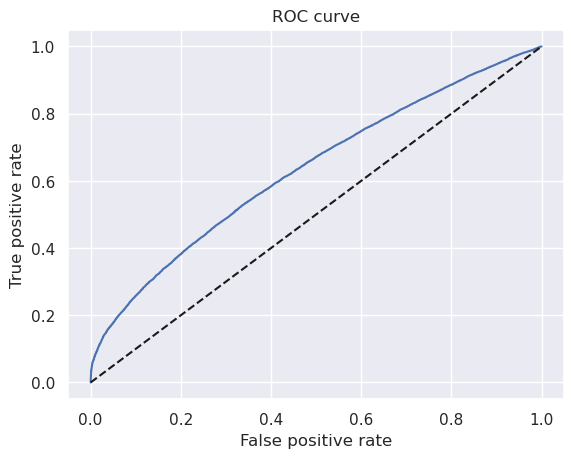

In [69]:
plt.plot(fpr, tpr)
# We plot the false positive rate along the x-axis and the true positive rate along the y-axis,
# thus plotting the ROC curve.
plt.plot(fpr, fpr, linestyle = '--', color = 'k')
# We plot a seconary diagonal line, with dashed line style and black color.
plt.xlabel('False positive rate')
# We name the x-axis "False positive rate".
plt.ylabel('True positive rate')
# We name the x-axis "True positive rate".
plt.title('ROC curve')
# We name the graph "ROC curve".

In [70]:
AUROC = roc_auc_score(df_actual_predicted_probs['lgd_targets_stage_1_test'], df_actual_predicted_probs['y_hat_test_proba_lgd_stage_1'])
# Calculates the Area Under the Receiver Operating Characteristic Curve (AUROC)
# from a set of actual values and their predicted probabilities.
AUROC

0.633387423349026

### Saving the Model

In [71]:
import pickle

In [72]:
pickle.dump(reg_lgd_st_1, open('lgd_model_stage_1.sav', 'wb'))
# Here we export our model to a 'SAV' file with file name 'lgd_model_stage_1.sav'.

### Stage 2 – Linear Regression

In [73]:
lgd_stage_2_data = loan_data_defaults[loan_data_defaults['recovery_rate_0_1'] == 1]
# Here we take only rows where the original recovery rate variable is greater than one,
# i.e. where the indicator variable we created is equal to 1.

In [74]:
# LGD model stage 2 datasets: how much more than 0 is the recovery rate
lgd_inputs_stage_2_train, lgd_inputs_stage_2_test, lgd_targets_stage_2_train, lgd_targets_stage_2_test = train_test_split(lgd_stage_2_data.drop(['recovery_rate','recovery_rate_0_1', 'CCF'], axis = 1), lgd_stage_2_data['recovery_rate'], test_size = 0.2, random_state = 42)
# Takes a set of inputs and a set of targets as arguments. Splits the inputs and the targets into four dataframes:
# Inputs - Train, Inputs - Test, Targets - Train, Targets - Test.

In [75]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score

In [76]:
# Since the p-values are obtained through certain statistics, we need the 'stat' module from scipy.stats
import scipy.stats as stat

#y Since we are using an object oriented language such as Python, we can simply define our own 
# LinearRegression class (the same one from sklearn)
# By typing the code below we will ovewrite a part of the class with one that includes p-values
# Here's the full source code of the ORIGINAL class: https://github.com/scikit-learn/scikit-learn/blob/7b136e9/sklearn/linear_model/base.py#L362


class LinearRegression(linear_model.LinearRegression):
    """
    LinearRegression class after sklearn's, but calculate t-statistics
    and p-values for model coefficients (betas).
    Additional attributes available after .fit()
    are `t` and `p` which are of the shape (y.shape[1], X.shape[1])
    which is (n_features, n_coefs)
    This class sets the intercept to 0 by default, since usually we include it
    in X.
    """
    
    # nothing changes in __init__
    def __init__(
        self,
        fit_intercept=True,
        normalize=False,
        copy_X=True,
        n_jobs=None,
        positive=False
    ):
        super().__init__(
            fit_intercept=fit_intercept,
            normalize=normalize,
            copy_X=copy_X,
            n_jobs=n_jobs,
            positive=positive
        )
    
    def fit(self, X, y, n_jobs=1):
        self = super(LinearRegression, self).fit(X, y, n_jobs)
        
        # Calculate SSE (sum of squared errors)
        # and SE (standard error)
        sse = np.sum((self.predict(X) - y) ** 2, axis=0) / float(X.shape[0] - X.shape[1])
        se = np.array([np.sqrt(np.diagonal(sse * np.linalg.inv(np.dot(X.T, X))))])

        # compute the t-statistic for each feature
        self.t = self.coef_ / se
        # find the p-value for each feature
        self.p = np.squeeze(2 * (1 - stat.t.cdf(np.abs(self.t), y.shape[0] - X.shape[1])))
        return self

In [77]:
import scipy.stats as stat

class LinearRegression(linear_model.LinearRegression):
    def __init__(self, fit_intercept=True, normalize=False, copy_X=True,
                 n_jobs=1):
        self.fit_intercept = fit_intercept
        self.normalize = normalize
        self.copy_X = copy_X
        self.n_jobs = n_jobs
    def fit(self, X, y, n_jobs=1):
        self = super(LinearRegression, self).fit(X, y, n_jobs)
        sse = np.sum((self.predict(X) - y) ** 2, axis=0) / float(X.shape[0] - X.shape[1])
        se = np.array([np.sqrt(np.diagonal(sse * np.linalg.inv(np.dot(X.T, X))))])
        self.t = self.coef_ / se
        self.p = np.squeeze(2 * (1 - stat.t.cdf(np.abs(self.t), y.shape[0] - X.shape[1])))
        return self

In [78]:
import numpy as np
import scipy.stats as stat
from sklearn import linear_model

class LinearRegression(linear_model.LinearRegression):
    def __init__(
        self,
        fit_intercept=True,
        normalize=False,
        copy_X=True,
        n_jobs=None,
        positive=False
    ):
        super().__init__(
            fit_intercept=fit_intercept,
            normalize=normalize,
            copy_X=copy_X,
            n_jobs=n_jobs,
            positive=positive
        )

    def fit(self, X, y):
        super().fit(X, y)

        n, p = X.shape

        # Predictions
        y_hat = self.predict(X)

        # Residuals
        residuals = y - y_hat

        # Degrees of freedom
        dof = n - p - int(self.fit_intercept)

        # Mean Squared Error
        mse = np.sum(residuals ** 2) / dof

        # Variance–Covariance Matrix
        XTX_inv = np.linalg.pinv(X.T @ X)
        var_beta = mse * np.diag(XTX_inv)

        # Standard errors
        se = np.sqrt(var_beta)

        # t-statistics
        self.t = self.coef_ / se

        # p-values (two-tailed)
        self.p = 2 * (1 - stat.t.cdf(np.abs(self.t), dof))

        return self


In [79]:
lgd_inputs_stage_2_train = lgd_inputs_stage_2_train[features_all]
# Here we keep only the variables we need for the model.

In [80]:
lgd_inputs_stage_2_train = lgd_inputs_stage_2_train.drop(features_reference_cat, axis = 1)
# Here we remove the dummy variable reference categories.

In [81]:
import numpy as np
import scipy.stats as stat
from sklearn import linear_model

class LinearRegression(linear_model.LinearRegression):
    def __init__(
        self,
        fit_intercept=True,
        copy_X=True,
        n_jobs=None,
        positive=False
    ):
        super().__init__(
            fit_intercept=fit_intercept,
            copy_X=copy_X,
            n_jobs=n_jobs,
            positive=positive
        )

    def fit(self, X, y):
        super().fit(X, y)

        n, p = X.shape

        # Predictions
        y_hat = self.predict(X)

        # Residuals
        residuals = y - y_hat

        # Degrees of freedom
        dof = n - p - int(self.fit_intercept)

        # Mean Squared Error
        mse = np.sum(residuals ** 2) / dof

        # Variance–Covariance matrix
        XTX_inv = np.linalg.pinv(X.T @ X)
        var_beta = mse * np.diag(XTX_inv)

        # Standard errors
        se = np.sqrt(var_beta)

        # t-statistics
        self.t = self.coef_ / se

        # p-values (two-tailed)
        self.p = 2 * (1 - stat.t.cdf(np.abs(self.t), dof))

        return self


In [82]:
reg_lgd_st_2 = LinearRegression()
# We create an instance of an object from the 'LogisticRegression' class.
reg_lgd_st_2.fit(lgd_inputs_stage_2_train, lgd_targets_stage_2_train)
# Estimates the coefficients of the object from the 'LogisticRegression' class
# with inputs (independent variables) contained in the first dataframe
# and targets (dependent variables) contained in the second dataframe.

LinearRegression()

In [83]:
feature_name = lgd_inputs_stage_2_train.columns.values
# Stores the names of the columns of a dataframe in a variable.

In [84]:
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
# Creates a dataframe with a column titled 'Feature name' and row values contained in the 'feature_name' variable.
summary_table['Coefficients'] = np.transpose(reg_lgd_st_2.coef_)
# Creates a new column in the dataframe, called 'Coefficients',
# with row values the transposed coefficients from the 'LogisticRegression' object.
summary_table.index = summary_table.index + 1
# Increases the index of every row of the dataframe with 1.
summary_table.loc[0] = ['Intercept', reg_lgd_st_2.intercept_]
# Assigns values of the row with index 0 of the dataframe.
summary_table = summary_table.sort_index()
# Sorts the dataframe by index.
p_values = reg_lgd_st_2.p
# We take the result of the newly added method 'p_values' and store it in a variable 'p_values'.
p_values = np.append(np.nan,np.array(p_values))
# We add the value 'NaN' in the beginning of the variable with p-values.
summary_table['p_values'] = p_values.round(3)
# In the 'summary_table' dataframe, we add a new column, called 'p_values', containing the values from the 'p_values' variable.
summary_table

,Feature name,Coefficients,p_values
0,Intercept,2.324662e-01,NaN
1,grade:A,-3.825439e-02,0.000
2,grade:B,-3.884687e-02,0.000
3,grade:C,-3.259225e-02,0.000
4,grade:D,-2.294265e-02,0.000
5,grade:E,-1.341871e-02,0.000
6,grade:F,-5.694703e-03,0.003
7,home_ownership:MORTGAGE,3.811915e-03,0.000
8,home_ownership:NONE,2.026490e-01,0.000
9,home_ownership:OTHER,-8.556265e-04,0.965


In [85]:
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
summary_table['Coefficients'] = np.transpose(reg_lgd_st_2.coef_)
summary_table.index = summary_table.index + 1
summary_table.loc[0] = ['Intercept', reg_lgd_st_2.intercept_]
summary_table = summary_table.sort_index()
p_values = reg_lgd_st_2.p
p_values = np.append(np.nan,np.array(p_values))
summary_table['p_values'] = p_values.round(3)
summary_table

,Feature name,Coefficients,p_values
0,Intercept,2.324662e-01,NaN
1,grade:A,-3.825439e-02,0.000
2,grade:B,-3.884687e-02,0.000
3,grade:C,-3.259225e-02,0.000
4,grade:D,-2.294265e-02,0.000
5,grade:E,-1.341871e-02,0.000
6,grade:F,-5.694703e-03,0.003
7,home_ownership:MORTGAGE,3.811915e-03,0.000
8,home_ownership:NONE,2.026490e-01,0.000
9,home_ownership:OTHER,-8.556265e-04,0.965


### Stage 2 – Linear Regression Evaluation

In [86]:
lgd_inputs_stage_2_test = lgd_inputs_stage_2_test[features_all]
# Here we keep only the variables we need for the model.

In [87]:
lgd_inputs_stage_2_test = lgd_inputs_stage_2_test.drop(features_reference_cat, axis = 1)
# Here we remove the dummy variable reference categories.

In [88]:
lgd_inputs_stage_2_test.columns.values
# Calculates the predicted values for the dependent variable (targets)
# based on the values of the independent variables (inputs) supplied as an argument.

array(['grade:A', 'grade:B', 'grade:C', 'grade:D', 'grade:E', 'grade:F',
       'home_ownership:MORTGAGE', 'home_ownership:NONE',
       'home_ownership:OTHER', 'home_ownership:OWN',
       'verification_status:Not Verified',
       'verification_status:Source Verified', 'purpose:car',
       'purpose:debt_consolidation', 'purpose:educational',
       'purpose:home_improvement', 'purpose:house',
       'purpose:major_purchase', 'purpose:medical', 'purpose:moving',
       'purpose:other', 'purpose:renewable_energy',
       'purpose:small_business', 'purpose:vacation', 'purpose:wedding',
       'initial_list_status:w', 'term_int', 'emp_length_int',
       'mths_since_issue_d', 'mths_since_earliest_cr_line', 'funded_amnt',
       'int_rate', 'installment', 'annual_inc', 'dti', 'delinq_2yrs',
       'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'total_acc',
       'acc_now_delinq', 'total_rev_hi_lim'], dtype=object)

In [89]:
y_hat_test_lgd_stage_2 = reg_lgd_st_2.predict(lgd_inputs_stage_2_test)
# Calculates the predicted values for the dependent variable (targets)
# based on the values of the independent variables (inputs) supplied as an argument.

In [90]:
lgd_targets_stage_2_test_temp = lgd_targets_stage_2_test

In [91]:
lgd_targets_stage_2_test_temp = lgd_targets_stage_2_test_temp.reset_index(drop = True)
# We reset the index of a dataframe.

In [92]:
pd.concat([lgd_targets_stage_2_test_temp, pd.DataFrame(y_hat_test_lgd_stage_2)], axis = 1).corr()
# We calculate the correlation between actual and predicted values.

,recovery_rate,0
recovery_rate,1.000000,0.213951
0,0.213951,1.000000


/tmp/ipykernel_790960/3715051216.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(lgd_targets_stage_2_test - y_hat_test_lgd_stage_2)


<Axes: xlabel='recovery_rate', ylabel='Density'>

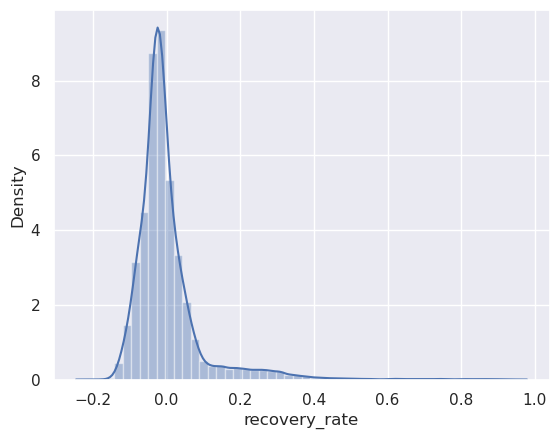

In [93]:
sns.distplot(lgd_targets_stage_2_test - y_hat_test_lgd_stage_2)
# We plot the distribution of the residuals.

In [94]:
pickle.dump(reg_lgd_st_2, open('lgd_model_stage_2.sav', 'wb'))
# Here we export our model to a 'SAV' file with file name 'lgd_model_stage_1.sav'.

### Combining Stage 1 and Stage 2

In [95]:
y_hat_test_lgd_stage_2_all = reg_lgd_st_2.predict(lgd_inputs_stage_1_test)

In [96]:
y_hat_test_lgd_stage_2_all

array([0.12025281, 0.11670493, 0.08644738, ..., 0.1133749 , 0.11728416,
       0.13579737])

In [97]:
y_hat_test_lgd = y_hat_test_lgd_stage_1 * y_hat_test_lgd_stage_2_all
# Here we combine the predictions of the models from the two stages.

In [98]:
pd.DataFrame(y_hat_test_lgd).describe()
# Shows some descriptive statisics for the values of a column.

,0
count,53864.000000
mean,0.060084
std,0.052243
min,0.000000
25%,0.000000
50%,0.084462
75%,0.106835
max,0.282078


In [99]:
y_hat_test_lgd = np.where(y_hat_test_lgd < 0, 0, y_hat_test_lgd)
y_hat_test_lgd = np.where(y_hat_test_lgd > 1, 1, y_hat_test_lgd)
# We set predicted values that are greater than 1 to 1 and predicted values that are less than 0 to 0.

In [100]:
pd.DataFrame(y_hat_test_lgd).describe()
# Shows some descriptive statisics for the values of a column.

,0
count,53864.000000
mean,0.060084
std,0.052243
min,0.000000
25%,0.000000
50%,0.084462
75%,0.106835
max,0.282078


# EAD Model

### Estimation and Interpretation

In [101]:
# EAD model datasets
ead_inputs_train, ead_inputs_test, ead_targets_train, ead_targets_test = train_test_split(loan_data_defaults.drop([ 'recovery_rate','recovery_rate_0_1', 'CCF'], axis = 1), loan_data_defaults['CCF'], test_size = 0.2, random_state = 42)
# Takes a set of inputs and a set of targets as arguments. Splits the inputs and the targets into four dataframes:
# Inputs - Train, Inputs - Test, Targets - Train, Targets - Test.

In [102]:
ead_inputs_train.columns.values

array(['Unnamed: 0.1', 'Unnamed: 0', 'id', 'member_id', 'loan_amnt',
       'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'issue_d',
       'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose', 'title',
       'zip_code', 'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'fico_range_low', 'fico_range_high', 'inq_last_6mths',
       'mths_since_last_delinq', 'mths_since_last_record', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'initial_list_status', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d',
       'last_credit_pull_d', 'last_fico_range_high',
       'last_fico_range_low', 'collections_12_mths_ex_med',
       'mth

In [103]:
ead_inputs_train = ead_inputs_train[features_all]
# Here we keep only the variables we need for the model.

In [104]:
ead_inputs_train = ead_inputs_train.drop(features_reference_cat, axis = 1)
# Here we remove the dummy variable reference categories.

In [105]:
reg_ead = LinearRegression()
# We create an instance of an object from the 'LogisticRegression' class.
reg_ead.fit(ead_inputs_train, ead_targets_train)
# Estimates the coefficients of the object from the 'LogisticRegression' class
# with inputs (independent variables) contained in the first dataframe
# and targets (dependent variables) contained in the second dataframe.

LinearRegression()

In [106]:
feature_name = ead_inputs_train.columns.values

In [107]:
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
# Creates a dataframe with a column titled 'Feature name' and row values contained in the 'feature_name' variable.
summary_table['Coefficients'] = np.transpose(reg_ead.coef_)
# Creates a new column in the dataframe, called 'Coefficients',
# with row values the transposed coefficients from the 'LogisticRegression' object.
summary_table.index = summary_table.index + 1
# Increases the index of every row of the dataframe with 1.
summary_table.loc[0] = ['Intercept', reg_ead.intercept_]
# Assigns values of the row with index 0 of the dataframe.
summary_table = summary_table.sort_index()
# Sorts the dataframe by index.
p_values = reg_lgd_st_2.p
# We take the result of the newly added method 'p_values' and store it in a variable 'p_values'.
p_values = np.append(np.nan,np.array(p_values))
# We add the value 'NaN' in the beginning of the variable with p-values.
summary_table['p_values'] = p_values
# In the 'summary_table' dataframe, we add a new column, called 'p_values', containing the values from the 'p_values' variable.
summary_table

,Feature name,Coefficients,p_values
0,Intercept,7.495648e-01,NaN
1,grade:A,3.883489e-02,0.000000e+00
2,grade:B,3.265142e-02,0.000000e+00
3,grade:C,3.159192e-02,0.000000e+00
4,grade:D,2.657746e-02,0.000000e+00
5,grade:E,1.819688e-02,8.881784e-16
6,grade:F,6.765954e-03,2.979140e-03
7,home_ownership:MORTGAGE,-1.475087e-03,7.032819e-12
8,home_ownership:NONE,1.007202e-01,1.216922e-08
9,home_ownership:OTHER,1.174202e-01,9.652608e-01


In [108]:
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
summary_table['Coefficients'] = np.transpose(reg_ead.coef_)
summary_table.index = summary_table.index + 1
summary_table.loc[0] = ['Intercept', reg_ead.intercept_]
summary_table = summary_table.sort_index()
p_values = reg_ead.p
p_values = np.append(np.nan,np.array(p_values))
summary_table['p_values'] = p_values
summary_table

,Feature name,Coefficients,p_values
0,Intercept,7.495648e-01,NaN
1,grade:A,3.883489e-02,0.000000e+00
2,grade:B,3.265142e-02,0.000000e+00
3,grade:C,3.159192e-02,0.000000e+00
4,grade:D,2.657746e-02,0.000000e+00
5,grade:E,1.819688e-02,1.988520e-10
6,grade:F,6.765954e-03,4.169992e-02
7,home_ownership:MORTGAGE,-1.475087e-03,1.164332e-01
8,home_ownership:NONE,1.007202e-01,2.412013e-01
9,home_ownership:OTHER,1.174202e-01,2.065214e-04


### Model Validation

In [109]:
ead_inputs_test = ead_inputs_test[features_all]
# Here we keep only the variables we need for the model.

In [110]:
ead_inputs_test = ead_inputs_test.drop(features_reference_cat, axis = 1)
# Here we remove the dummy variable reference categories.

In [111]:
ead_inputs_test.columns.values

array(['grade:A', 'grade:B', 'grade:C', 'grade:D', 'grade:E', 'grade:F',
       'home_ownership:MORTGAGE', 'home_ownership:NONE',
       'home_ownership:OTHER', 'home_ownership:OWN',
       'verification_status:Not Verified',
       'verification_status:Source Verified', 'purpose:car',
       'purpose:debt_consolidation', 'purpose:educational',
       'purpose:home_improvement', 'purpose:house',
       'purpose:major_purchase', 'purpose:medical', 'purpose:moving',
       'purpose:other', 'purpose:renewable_energy',
       'purpose:small_business', 'purpose:vacation', 'purpose:wedding',
       'initial_list_status:w', 'term_int', 'emp_length_int',
       'mths_since_issue_d', 'mths_since_earliest_cr_line', 'funded_amnt',
       'int_rate', 'installment', 'annual_inc', 'dti', 'delinq_2yrs',
       'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'total_acc',
       'acc_now_delinq', 'total_rev_hi_lim'], dtype=object)

In [112]:
y_hat_test_ead = reg_ead.predict(ead_inputs_test)
# Calculates the predicted values for the dependent variable (targets)
# based on the values of the independent variables (inputs) supplied as an argument.

In [113]:
ead_targets_test_temp = ead_targets_test

In [114]:
ead_targets_test_temp = ead_targets_test_temp.reset_index(drop = True)
# We reset the index of a dataframe.

In [115]:
pd.concat([ead_targets_test_temp, pd.DataFrame(y_hat_test_ead)], axis = 1).corr()
# We calculate the correlation between actual and predicted values.

,CCF,0
CCF,1.00000,0.47846
0,0.47846,1.00000


/tmp/ipykernel_790960/4017325749.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(ead_targets_test - y_hat_test_ead)


<Axes: xlabel='CCF', ylabel='Density'>

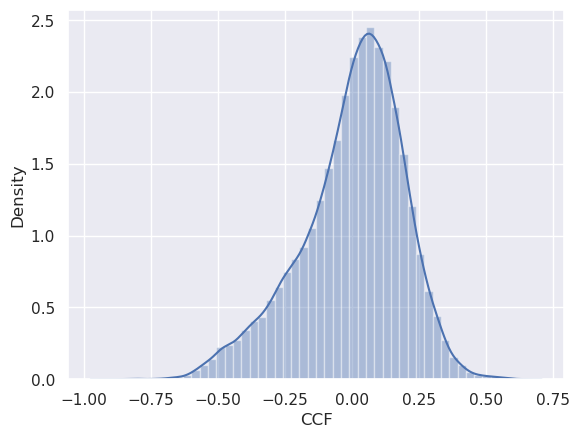

In [116]:
sns.distplot(ead_targets_test - y_hat_test_ead)
# We plot the distribution of the residuals.

In [117]:
pd.DataFrame(y_hat_test_ead).describe()
# Shows some descriptive statisics for the values of a column.

,0
count,53864.000000
mean,0.696584
std,0.104824
min,0.249748
25%,0.622429
50%,0.693762
75%,0.766665
max,1.077259


In [118]:
y_hat_test_ead = np.where(y_hat_test_ead < 0, 0, y_hat_test_ead)
y_hat_test_ead = np.where(y_hat_test_ead > 1, 1, y_hat_test_ead)
# We set predicted values that are greater than 1 to 1 and predicted values that are less than 0 to 0.

In [119]:
pd.DataFrame(y_hat_test_ead).describe()
# Shows some descriptive statisics for the values of a column.

,0
count,53864.000000
mean,0.696560
std,0.104749
min,0.249748
25%,0.622429
50%,0.693762
75%,0.766665
max,1.000000


# Expected Loss Calculation

#### We dont care about the Expected Loss from Single account or custom

In [120]:
loan_data_preprocessed.head()

,Unnamed: 0.1,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,...,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w
0,0,0,68407277,NaN,3600.0,3600.0,3600.0,36 months,13.99,123.03,...,0,0,0,0,0,0,0,0,0,1
1,1,1,68355089,NaN,24700.0,24700.0,24700.0,36 months,11.99,820.28,...,0,0,0,0,0,0,0,0,0,1
2,2,2,68341763,NaN,20000.0,20000.0,20000.0,60 months,10.78,432.66,...,0,0,0,0,0,0,0,0,0,1
3,3,3,66310712,NaN,35000.0,35000.0,35000.0,60 months,14.85,829.90,...,0,0,0,0,0,0,0,0,0,1
4,4,4,68476807,NaN,10400.0,10400.0,10400.0,60 months,22.45,289.91,...,0,0,0,0,0,0,0,0,0,1


In [121]:
loan_data_preprocessed['mths_since_last_delinq'].fillna(0, inplace = True)
# We fill the missing values with zeroes.

In [122]:
loan_data_preprocessed['mths_since_last_record'].fillna(0, inplace = True)
# We fill the missing values with zeroes.

In [123]:
loan_data_preprocessed_lgd_ead = loan_data_preprocessed[features_all]
# Here we keep only the variables we need for the model.

In [124]:
loan_data_preprocessed_lgd_ead = loan_data_preprocessed_lgd_ead.drop(features_reference_cat, axis = 1)
# Here we remove the dummy variable reference categories.

In [126]:
loan_data_preprocessed_lgd_ead.isnull().sum()

grade:A                                 0
grade:B                                 0
grade:C                                 0
grade:D                                 0
grade:E                                 0
grade:F                                 0
home_ownership:MORTGAGE                 0
home_ownership:NONE                     0
home_ownership:OTHER                    0
home_ownership:OWN                      0
verification_status:Not Verified        0
verification_status:Source Verified     0
purpose:car                             0
purpose:debt_consolidation              0
purpose:educational                     0
purpose:home_improvement                0
purpose:house                           0
purpose:major_purchase                  0
purpose:medical                         0
purpose:moving                          0
purpose:other                           0
purpose:renewable_energy                0
purpose:small_business                  0
purpose:vacation                  

In [129]:
cols_to_impute = [
    'term_int',
    'mths_since_issue_d',
    'int_rate',
    'installment'
]

In [130]:
for col in cols_to_impute:
    loan_data_preprocessed_lgd_ead[col] = loan_data_preprocessed_lgd_ead[col].fillna(
        loan_data_preprocessed_lgd_ead[col].median()
    )

In [131]:
loan_data_preprocessed_lgd_ead.isnull().sum()

grade:A                                0
grade:B                                0
grade:C                                0
grade:D                                0
grade:E                                0
grade:F                                0
home_ownership:MORTGAGE                0
home_ownership:NONE                    0
home_ownership:OTHER                   0
home_ownership:OWN                     0
verification_status:Not Verified       0
verification_status:Source Verified    0
purpose:car                            0
purpose:debt_consolidation             0
purpose:educational                    0
purpose:home_improvement               0
purpose:house                          0
purpose:major_purchase                 0
purpose:medical                        0
purpose:moving                         0
purpose:other                          0
purpose:renewable_energy               0
purpose:small_business                 0
purpose:vacation                       0
purpose:wedding 

In [132]:
loan_data_preprocessed['recovery_rate_st_1'] = reg_lgd_st_1.model.predict(loan_data_preprocessed_lgd_ead)
# We apply the stage 1 LGD model and calculate predicted values.

In [133]:
loan_data_preprocessed['recovery_rate_st_2'] = reg_lgd_st_2.predict(loan_data_preprocessed_lgd_ead)
# We apply the stage 2 LGD model and calculate predicted values.

In [134]:
loan_data_preprocessed['recovery_rate'] = loan_data_preprocessed['recovery_rate_st_1'] * loan_data_preprocessed['recovery_rate_st_2']
# We combine the predicted values from the stage 1 predicted model and the stage 2 predicted model
# to calculate the final estimated recovery rate.

In [135]:
loan_data_preprocessed['recovery_rate'] = np.where(loan_data_preprocessed['recovery_rate'] < 0, 0, loan_data_preprocessed['recovery_rate'])
loan_data_preprocessed['recovery_rate'] = np.where(loan_data_preprocessed['recovery_rate'] > 1, 1, loan_data_preprocessed['recovery_rate'])
# We set estimated recovery rates that are greater than 1 to 1 and  estimated recovery rates that are less than 0 to 0.

In [136]:
loan_data_preprocessed['LGD'] = 1 - loan_data_preprocessed['recovery_rate']
# We calculate estimated LGD. Estimated LGD equals 1 - estimated recovery rate.

In [137]:
loan_data_preprocessed['LGD'].describe()
# Shows some descriptive statisics for the values of a column.

count    2.260701e+06
mean     9.493702e-01
std      5.292351e-02
min      6.890669e-01
25%      8.962372e-01
50%      1.000000e+00
75%      1.000000e+00
max      1.000000e+00
Name: LGD, dtype: float64

In [138]:
loan_data_preprocessed['CCF'] = reg_ead.predict(loan_data_preprocessed_lgd_ead)
# We apply the EAD model to calculate estimated credit conversion factor.

In [139]:
loan_data_preprocessed['CCF'] = np.where(loan_data_preprocessed['CCF'] < 0, 0, loan_data_preprocessed['CCF'])
loan_data_preprocessed['CCF'] = np.where(loan_data_preprocessed['CCF'] > 1, 1, loan_data_preprocessed['CCF'])
# We set estimated CCF that are greater than 1 to 1 and  estimated CCF that are less than 0 to 0.

In [140]:
loan_data_preprocessed['EAD'] = loan_data_preprocessed['CCF'] * loan_data_preprocessed_lgd_ead['funded_amnt']
# We calculate estimated EAD. Estimated EAD equals estimated CCF multiplied by funded amount.

In [141]:
loan_data_preprocessed['EAD'].describe()
# Shows some descriptive statisics for the values of a column.

count    2.260701e+06
mean     1.073439e+04
std      7.296072e+03
min      0.000000e+00
25%      5.053196e+03
50%      8.919000e+03
75%      1.468022e+04
max      4.000000e+04
Name: EAD, dtype: float64

In [142]:
loan_data_preprocessed.head()

,Unnamed: 0.1,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,...,addr_state:WV,addr_state:WY,initial_list_status:f,initial_list_status:w,recovery_rate_st_1,recovery_rate_st_2,recovery_rate,LGD,CCF,EAD
0,0,0,68407277,NaN,3600.0,3600.0,3600.0,36 months,13.99,123.03,...,0,0,0,1,1,0.105489,0.105489,0.894511,0.648314,2333.930385
1,1,1,68355089,NaN,24700.0,24700.0,24700.0,36 months,11.99,820.28,...,0,0,0,1,1,0.108519,0.108519,0.891481,0.713244,17617.135601
2,2,2,68341763,NaN,20000.0,20000.0,20000.0,60 months,10.78,432.66,...,0,0,0,1,1,0.114389,0.114389,0.885611,0.756171,15123.417288
3,3,3,66310712,NaN,35000.0,35000.0,35000.0,60 months,14.85,829.90,...,0,0,0,1,1,0.115479,0.115479,0.884521,0.771339,26996.861293
4,4,4,68476807,NaN,10400.0,10400.0,10400.0,60 months,22.45,289.91,...,0,0,0,1,0,0.149161,0.000000,1.000000,0.871376,9062.306767


In [143]:
loan_data_inputs_train = pd.read_csv('loan_data_inputs_train.csv')
# We import data to apply the PD model.

/tmp/ipykernel_790960/2649069239.py:1: DtypeWarning: Columns (2,131,132,133,136,137,138,141) have mixed types. Specify dtype option on import or set low_memory=False.
  loan_data_inputs_train = pd.read_csv('loan_data_inputs_train.csv')


In [144]:
loan_data_inputs_test = pd.read_csv('loan_data_inputs_test.csv')
# We import data to apply the PD model.

/tmp/ipykernel_790960/2338450731.py:1: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  loan_data_inputs_test = pd.read_csv('loan_data_inputs_test.csv')


In [145]:
loan_data_inputs_pd = pd.concat([loan_data_inputs_train, loan_data_inputs_test], axis = 0)
# We concatenate the two dataframes along the rows.

In [146]:
loan_data_inputs_pd.shape

(2260701, 393)

In [147]:
loan_data_inputs_pd.head()

,Unnamed: 0.1,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,...,dti:25.6-30,dti:30-35,dti:>35,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
0,1800887,1800887,7052080,NaN,13000.0,13000.0,13000.0,36 months,14.33,446.40,...,0,0,0,1,0,0,0,0,0,0
1,1130140,1130140,35793918,NaN,1000.0,1000.0,1000.0,36 months,14.31,34.33,...,0,0,1,1,0,0,0,0,0,0
2,459855,459855,129181394,NaN,32000.0,32000.0,32000.0,60 months,16.01,778.35,...,0,0,0,1,0,0,0,0,0,0
3,283070,283070,48525958,NaN,21000.0,21000.0,21000.0,36 months,6.39,642.58,...,0,0,0,1,0,0,0,0,0,0
4,1785392,1785392,7711435,NaN,12000.0,12000.0,11975.0,36 months,12.99,404.27,...,0,0,0,0,0,0,0,1,0,0


In [148]:
loan_data_inputs_pd = loan_data_inputs_pd.set_index('Unnamed: 0')
# We set the index of the dataframe to the values of a specific column. 

In [149]:
loan_data_inputs_pd.head()

,Unnamed: 0.1,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,...,dti:25.6-30,dti:30-35,dti:>35,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
1800887,1800887,7052080,NaN,13000.0,13000.0,13000.0,36 months,14.33,446.40,C,...,0,0,0,1,0,0,0,0,0,0
1130140,1130140,35793918,NaN,1000.0,1000.0,1000.0,36 months,14.31,34.33,C,...,0,0,1,1,0,0,0,0,0,0
459855,459855,129181394,NaN,32000.0,32000.0,32000.0,60 months,16.01,778.35,C,...,0,0,0,1,0,0,0,0,0,0
283070,283070,48525958,NaN,21000.0,21000.0,21000.0,36 months,6.39,642.58,A,...,0,0,0,1,0,0,0,0,0,0
1785392,1785392,7711435,NaN,12000.0,12000.0,11975.0,36 months,12.99,404.27,B,...,0,0,0,0,0,0,0,1,0,0


In [169]:
features_all_pd = [

    # =========================
    # GRADE
    # =========================
    'grade:A',
    'grade:B',
    'grade:C',
    'grade:D',
    'grade:E',
    'grade:F',
    'grade:G',

    # =========================
    # HOME OWNERSHIP
    # =========================
    'home_ownership:RENT_OTHER_NONE_ANY',
    'home_ownership:MORTGAGE',
    'home_ownership:OWN',

    # =========================
    # ADDR_STATE
    # =========================
    'addr_state:IA_AL_AR_MS_OK_LA_NV',
    'addr_state:HI_NM_SD_FL',
    'addr_state:MO_MD_NC_NJ_TN_IN',
    'addr_state:PA_VA_MI_MN_KY_OH_AZ_NE',
    'addr_state:AK_DE_UT_MA_WI_GA_RI',
    'addr_state:IL_WY_MT',
    'addr_state:ND_KS_WA_CT_SC_CO',
    'addr_state:WV_DC_OR_NH_ID_VT_ME',
    'addr_state:CA',
    'addr_state:NY',
    'addr_state:TX',

    # =========================
    # VERIFICATION STATUS
    # =========================
    'verification_status:Not Verified',
    'verification_status:Source Verified',
    'verification_status:Verified',

    # =========================
    # PURPOSE
    # =========================
    'purpose:educ_sm_b_ren_en_mov',
    'purpose:debt_cons_med_other',
    'purpose:vac_house_wed_major_purch_car_home_impr',

    # =========================
    # INITIAL LIST STATUS
    # =========================
    'initial_list_status:f',
    'initial_list_status:w',

    # =========================
    # TERM
    # =========================
    'term:36',
    'term:60',

    # =========================
    # EMP LENGTH
    # =========================
    'emp_length:0',
    'emp_length:1',
    'emp_length:2-6',
    'emp_length:7-9',
    'emp_length:10',

    # =========================
    # MTHS SINCE ISSUE D
    # =========================
    'mths_since_issue_d:85-88',
    'mths_since_issue_d:88-91',
    'mths_since_issue_d:91-93',
    'mths_since_issue_d:93-102',
    'mths_since_issue_d:102-113',
    'mths_since_issue_d:113-165',
    'mths_since_issue_d:>165',

    # =========================
    # INT RATE
    # =========================
    'int_rate:<=7.878',
    'int_rate:7.878-11.987',
    'int_rate:11.987-22.772',
    'int_rate:>22.772',

    # =========================
    # MTHS SINCE EARLIEST CR LINE
    # =========================
    'mths_since_earliest_cr_line:<=267',
    'mths_since_earliest_cr_line:267-557',
    'mths_since_earliest_cr_line:>557',

    # =========================
    # INQ LAST 6 MONTHS
    # =========================
    'inq_last_6mths:0',
    'inq_last_6mths:1-2',
    'inq_last_6mths:3-6',
    'inq_last_6mths:>6',

    # =========================
    # OPEN ACC
    # =========================
    'open_acc:0',
    'open_acc:1-3',
    'open_acc:4-12',
    'open_acc:13-17',
    'open_acc:18-22',
    'open_acc:23-25',
    'open_acc:26-30',
    'open_acc:>=31',

    # =========================
    # ACC NOW DELINQ
    # =========================
    'acc_now_delinq:0',
    'acc_now_delinq:>=1',

    # =========================
    # TOTAL REV HI LIM
    # =========================
    'total_rev_hi_lim:<=5K',
    'total_rev_hi_lim:5K-10K',
    'total_rev_hi_lim:10K-20K',
    'total_rev_hi_lim:20K-30K',
    'total_rev_hi_lim:30K-40K',
    'total_rev_hi_lim:40K-55K',
    'total_rev_hi_lim:55K-95K',
    'total_rev_hi_lim:>95K',

    # =========================
    # ANNUAL INC
    # =========================
    'annual_inc:<20K',
    'annual_inc:20K-30K',
    'annual_inc:30K-40K',
    'annual_inc:40K-50K',
    'annual_inc:50K-60K',
    'annual_inc:60K-70K',
    'annual_inc:70K-80K',
    'annual_inc:80K-90K',
    'annual_inc:90K-100K',
    'annual_inc:100K-120K',
    'annual_inc:120K-140K',
    'annual_inc:>140K',

    # =========================
    # DTI
    # =========================
    'dti:<=2',
    'dti:2-4',
    'dti:4-8',
    'dti:8-12.4',
    'dti:12.4-16.8',
    'dti:16.8-21.2',
    'dti:21.2-25.6',
    'dti:25.6-30',
    'dti:30-35',
    'dti:>35',

    # =========================
    # MTHS SINCE LAST DELINQ
    # =========================
    'mths_since_last_delinq:Missing',
    'mths_since_last_delinq:0-10',
    'mths_since_last_delinq:10-30',
    'mths_since_last_delinq:30-70',
    'mths_since_last_delinq:>=70',

    # =========================
    # MTHS SINCE LAST RECORD
    # =========================
    'mths_since_last_record:Missing',
    'mths_since_last_record:0-2',
    'mths_since_last_record:3-20',
    'mths_since_last_record:21-31',
    'mths_since_last_record:32-80',
    'mths_since_last_record:81-86',
    'mths_since_last_record:>=86'
]

In [170]:
ref_categories_pd = [

    # =========================
    # GRADE
    # =========================
    'grade:G',

    # =========================
    # HOME OWNERSHIP
    # =========================
    'home_ownership:RENT_OTHER_NONE_ANY',

    # =========================
    # ADDR_STATE
    # =========================
    'addr_state:WV_DC_OR_NH_ID_VT_ME',

    # =========================
    # VERIFICATION STATUS
    # =========================
    'verification_status:Verified',

    # =========================
    # PURPOSE
    # =========================
    'purpose:debt_cons_med_other',

    # =========================
    # INITIAL LIST STATUS
    # =========================
    'initial_list_status:w',

    # =========================
    # TERM
    # =========================
    'term:60',

    # =========================
    # EMP LENGTH
    # =========================
    'emp_length:0',

    # =========================
    # MTHS SINCE ISSUE D
    # =========================
    'mths_since_issue_d:>165',

    # =========================
    # INT RATE
    # =========================
    'int_rate:>22.772',

    # =========================
    # MTHS SINCE EARLIEST CR LINE
    # =========================
    'mths_since_earliest_cr_line:>557',

    # =========================
    # INQ LAST 6 MONTHS
    # =========================
    'inq_last_6mths:>6',

    # =========================
    # OPEN ACC
    # =========================
    'open_acc:>=31',

    # =========================
    # ACC NOW DELINQ
    # =========================
    'acc_now_delinq:>=1',

    # =========================
    # TOTAL REV HI LIM
    # =========================
    'total_rev_hi_lim:>95K',

    # =========================
    # ANNUAL INC
    # =========================
    'annual_inc:>140K',

    # =========================
    # DTI
    # =========================
    'dti:>35',

    # =========================
    # MTHS SINCE LAST DELINQ
    # =========================
    'mths_since_last_delinq:>=70',

    # =========================
    # MTHS SINCE LAST RECORD
    # =========================
    'mths_since_last_record:>=86'
]


In [171]:
loan_data_inputs_pd_temp = loan_data_inputs_pd[features_all_pd]
# Here we keep only the variables we need for the model.

In [172]:
loan_data_inputs_pd_temp = loan_data_inputs_pd_temp.drop(ref_categories_pd, axis = 1)
# Here we remove the dummy variable reference categories.

In [173]:
loan_data_inputs_pd_temp.shape

(2260701, 87)

In [174]:
import pickle

In [175]:
reg_pd = pickle.load(open('pd_model.sav', 'rb'))
# We import the PD model, stored in the 'pd_model.sav' file.

In [176]:
reg_pd.model.predict_proba(loan_data_inputs_pd_temp)[: ][: , 0]
# We apply the PD model to caclulate estimated default probabilities.

array([0.13614075, 0.12744655, 0.05990464, ..., 0.06105206, 0.00653587,
       0.02462557])

In [177]:
loan_data_inputs_pd['PD'] = reg_pd.model.predict_proba(loan_data_inputs_pd_temp)[: ][: , 0]
# We apply the PD model to caclulate estimated default probabilities.

In [178]:
loan_data_inputs_pd['PD'].head()

Unnamed: 0
1800887    0.136141
1130140    0.127447
459855     0.059905
283070     0.033314
1785392    0.134617
Name: PD, dtype: float64

In [179]:
loan_data_inputs_pd['PD'].describe()
# Shows some descriptive statisics for the values of a column.

count    2.260701e+06
mean     1.283882e-01
std      1.003501e-01
min      6.808228e-04
25%      4.777321e-02
50%      1.075154e-01
75%      1.848361e-01
max      6.882421e-01
Name: PD, dtype: float64

In [180]:
loan_data_preprocessed_new = pd.concat([loan_data_preprocessed, loan_data_inputs_pd], axis = 1)
# We concatenate the dataframes where we calculated LGD and EAD and the dataframe where we calculated PD along the columns.

In [181]:
loan_data_preprocessed_new.shape

(2260701, 684)

In [182]:
loan_data_preprocessed_new.head()

,Unnamed: 0.1,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,...,dti:30-35,dti:>35,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86,PD
0,0,0,68407277,NaN,3600.0,3600.0,3600.0,36 months,13.99,123.03,...,0,0,1,0,0,0,0,0,0,0.130686
1,1,1,68355089,NaN,24700.0,24700.0,24700.0,36 months,11.99,820.28,...,0,0,1,0,0,0,0,0,0,0.187922
2,2,2,68341763,NaN,20000.0,20000.0,20000.0,60 months,10.78,432.66,...,0,0,1,0,0,0,0,0,0,0.070986
3,3,3,66310712,NaN,35000.0,35000.0,35000.0,60 months,14.85,829.90,...,0,0,1,0,0,0,0,0,0,0.158343
4,4,4,68476807,NaN,10400.0,10400.0,10400.0,60 months,22.45,289.91,...,0,0,1,0,0,0,0,0,0,0.354919


In [183]:
loan_data_preprocessed_new['EL'] = loan_data_preprocessed_new['PD'] * loan_data_preprocessed_new['LGD'] * loan_data_preprocessed_new['EAD']
# We calculate Expected Loss. EL = PD * LGD * EAD.

In [184]:
loan_data_preprocessed_new['EL'].describe()
# Shows some descriptive statisics for the values of a column.

count    2.260701e+06
mean     1.328249e+03
std      1.614169e+03
min      0.000000e+00
25%      2.915977e+02
50%      7.275477e+02
75%      1.733632e+03
max      1.935758e+04
Name: EL, dtype: float64

In [185]:
loan_data_preprocessed_new[['funded_amnt', 'PD', 'LGD', 'EAD', 'EL']].head()

,funded_amnt,funded_amnt,PD,LGD,EAD,EL
0,3600.0,3600.0,0.130686,0.894511,2333.930385,272.835695
1,24700.0,24700.0,0.187922,0.891481,17617.135601,2951.383180
2,20000.0,20000.0,0.070986,0.885611,15123.417288,950.753751
3,35000.0,35000.0,0.158343,0.884521,26996.861293,3781.116414
4,10400.0,10400.0,0.354919,1.000000,9062.306767,3216.386132


In [186]:
loan_data_preprocessed_new['funded_amnt'].describe()

,funded_amnt,funded_amnt
count,2.260701e+06,2.260701e+06
mean,1.504163e+04,1.504163e+04
std,9.188350e+03,9.188350e+03
min,5.000000e+02,5.000000e+02
25%,8.000000e+03,8.000000e+03
50%,1.287500e+04,1.287500e+04
75%,2.000000e+04,2.000000e+04
max,4.000000e+04,4.000000e+04


In [187]:
loan_data_preprocessed_new['EL'].sum()
# Total Expected Loss for all loans.

3002773015.7171288

In [188]:
loan_data_preprocessed_new['funded_amnt'].sum()
# Total funded amount for all loans.

funded_amnt    3.400463e+10
funded_amnt    3.400463e+10
dtype: float64

In [189]:
loan_data_preprocessed_new['EL'].sum() / loan_data_preprocessed_new['funded_amnt'].sum()
# Total Expected Loss as a proportion of total funded amount for all loans.
####
####
####
# THE END.

funded_amnt    0.088305
funded_amnt    0.088305
dtype: float64